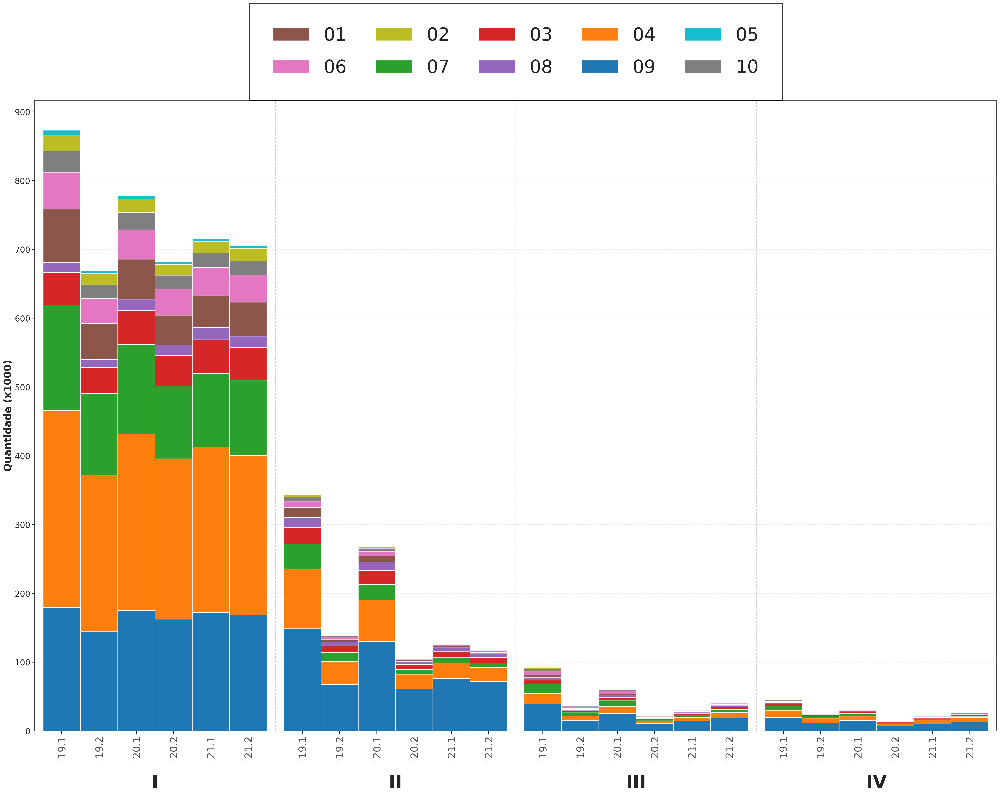

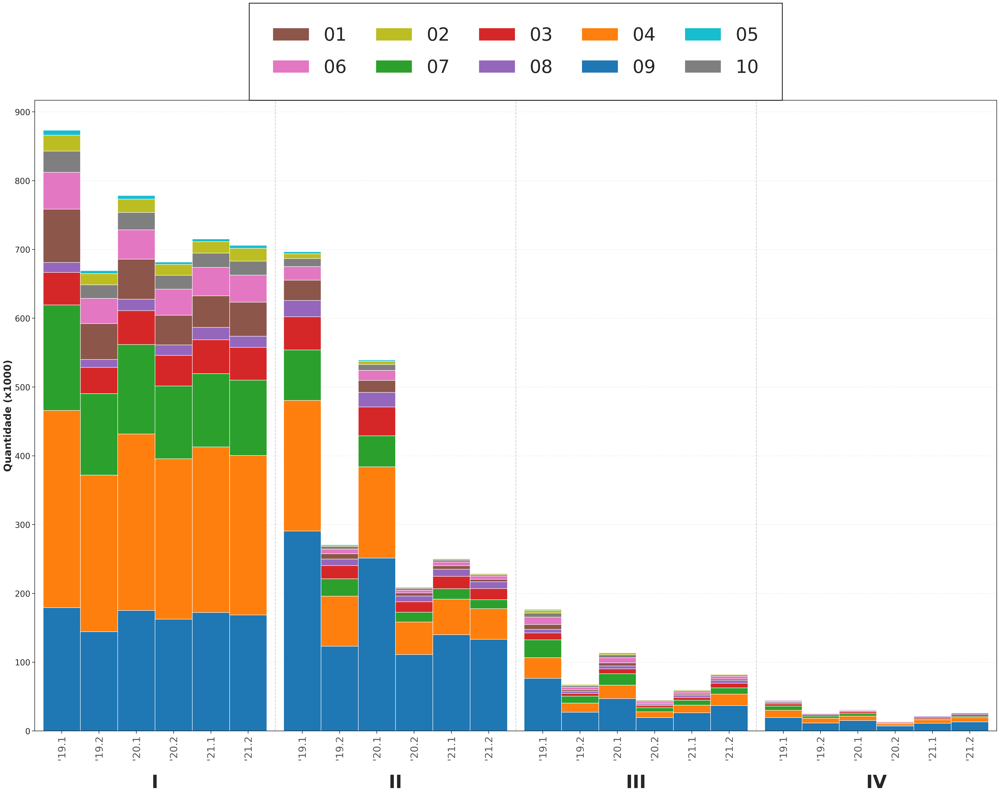

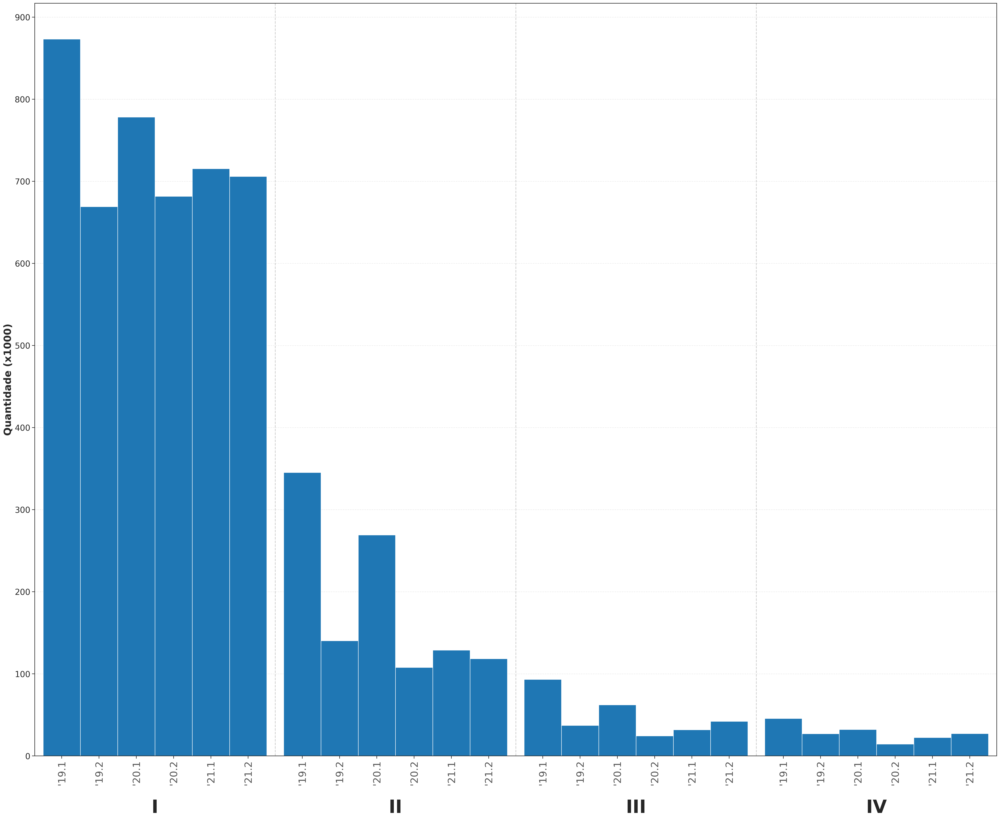

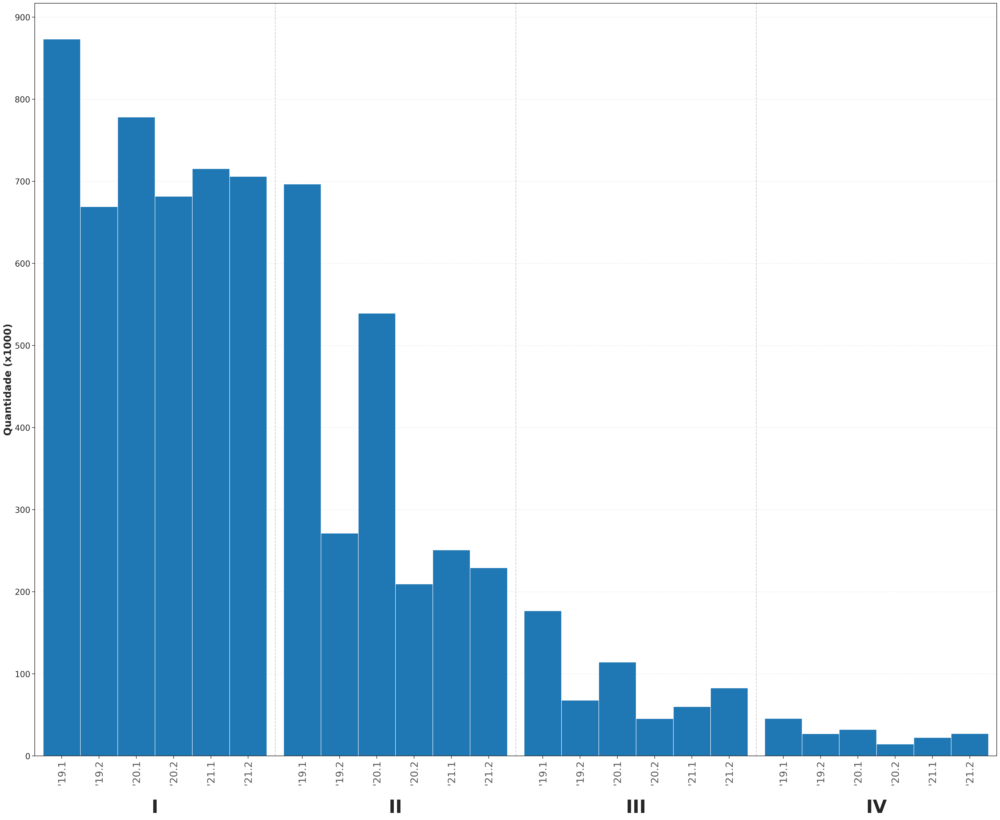

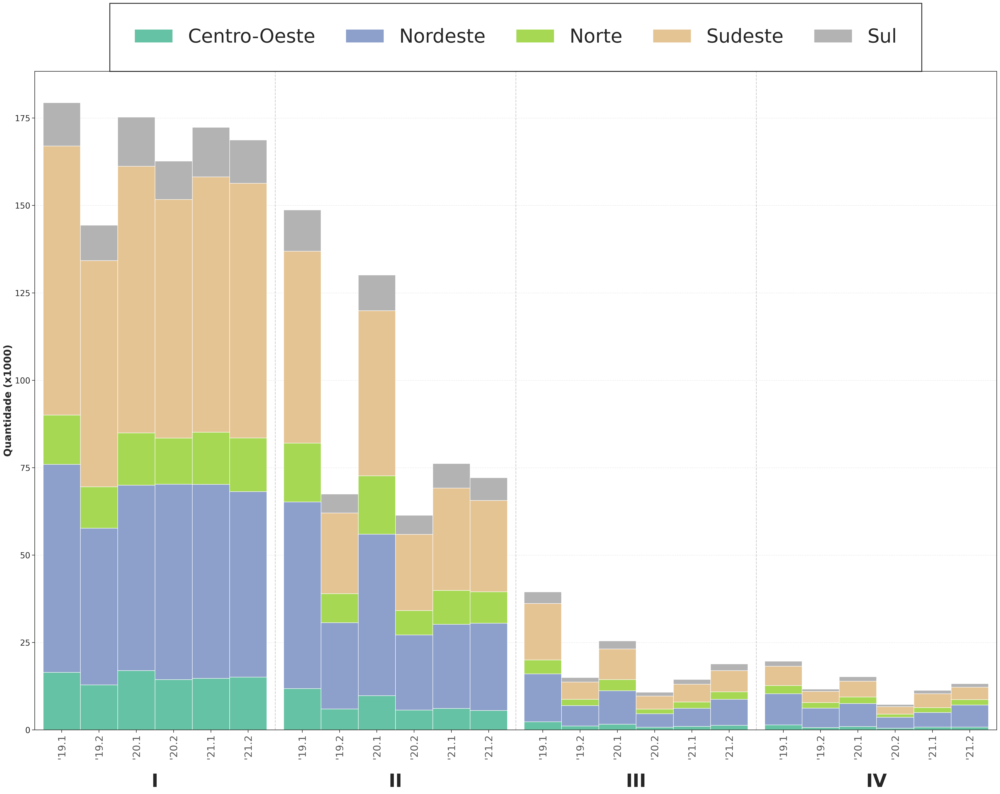

...

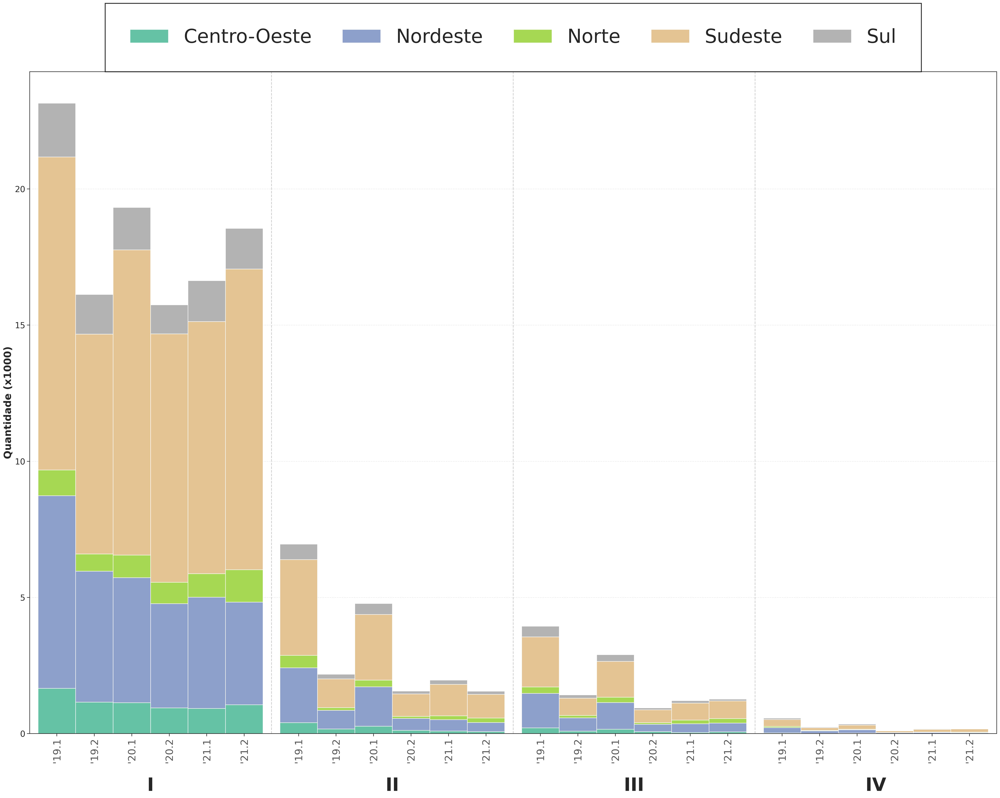

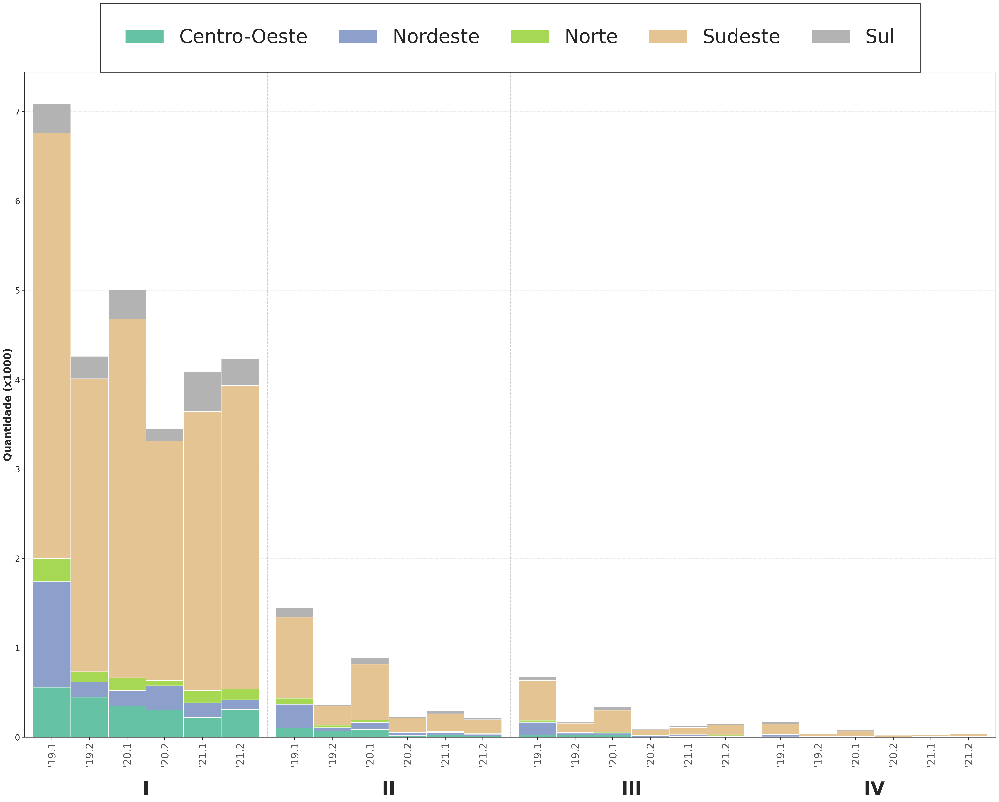

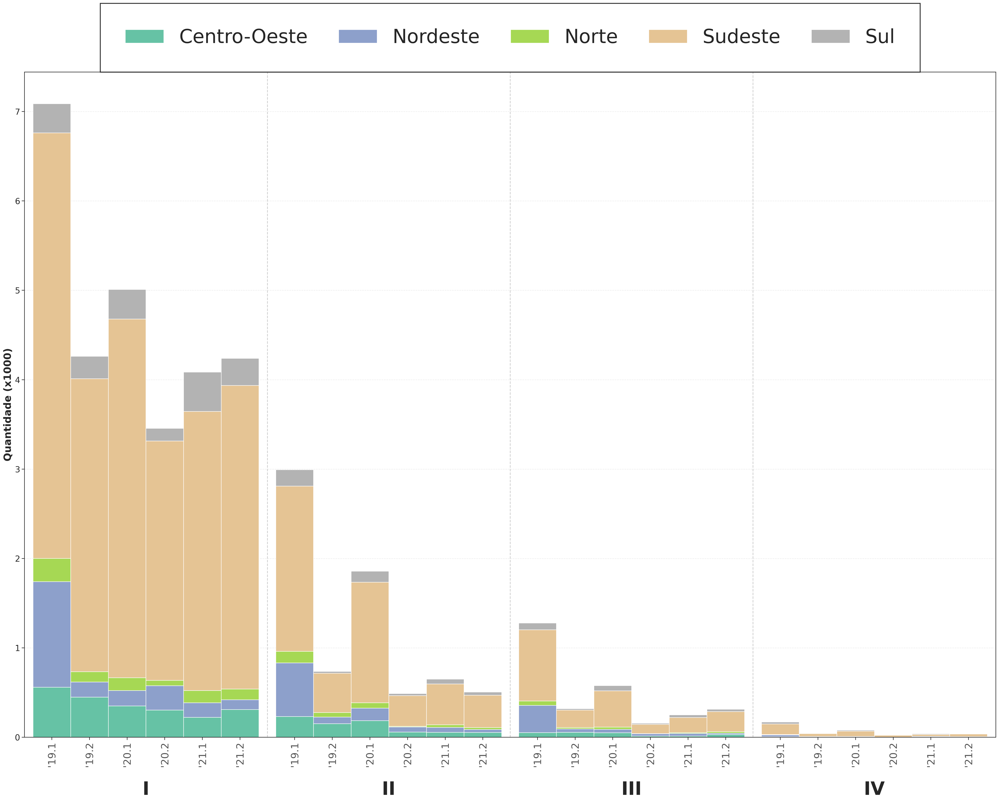

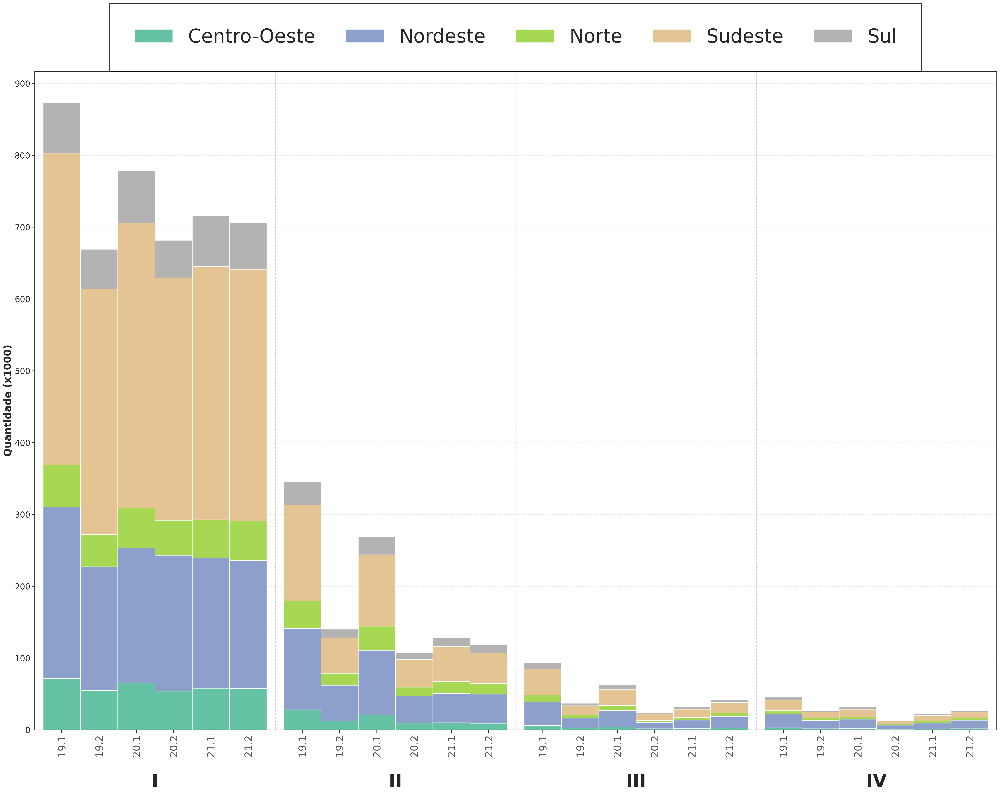

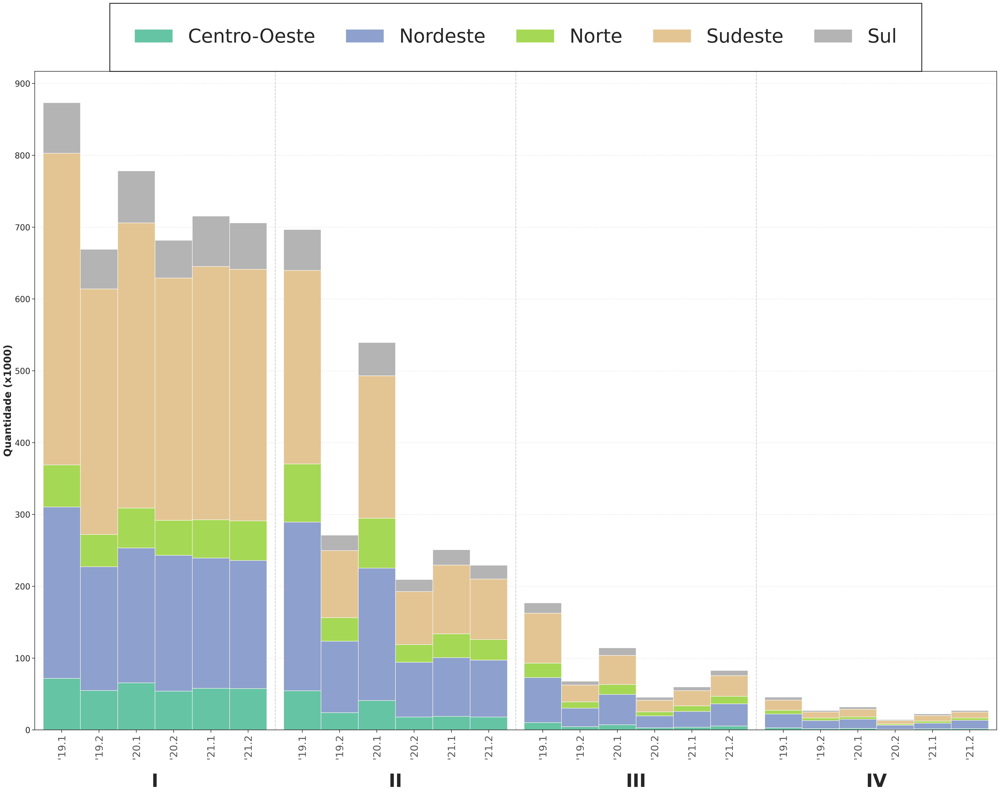

In [ ]:
def eda_gerar_funil_de_selecao_6_etapas_v2():
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    import numpy as np
    import matplotlib.ticker as ticker
    from pathlib import Path
    from constantes import pasta_data_05_processed

    # ==============================================================================
    # 0. ESTILO ACADÊMICO GLOBAL
    # ==============================================================================
    sns.set_theme(style="ticks")
    plt.rcParams['figure.dpi'] = 240
    plt.rcParams['savefig.dpi'] = 700

    # ==============================================================================
    # 1. PREPARAÇÃO DOS DADOS
    # ==============================================================================
    path_funil_regiao = pasta_data_05_processed / 'funil_por_regiao.parquet'
    df = pd.read_parquet(str(path_funil_regiao))

    if 'regiao_ies' in df.columns:
        df = df.rename(columns={'regiao_ies': 'regiao'})
        
    df['periodo'] = df['ano'].astype(str) + '.' + df['semestre'].astype(str)
    df['nome_cine_area_geral'] = df['nome_cine_area_geral'].fillna('CINE Não Informado (MEC)')

    mapa_codigo_cine = {
        'Agricultura, silvicultura, pesca e veterinária': '08',
        'Artes e humanidades': '02',
        'Ciências naturais, matemática e estatística': '05',
        'Ciências sociais, comunicação e informação': '03',
        'Computação e Tecnologias da Informação e Comunicação (TIC)': '06',
        'Computação e Tecnologias da Informação e Comunicação': '06',
        'Educação': '01',
        'Engenharia, produção e construção': '07',
        'Negócios, administração e direito': '04',
        'Saúde e bem-estar': '09',
        'Serviços': '10'
    }

    df['codigo_cine_area_geral'] = df['nome_cine_area_geral'].map(mapa_codigo_cine).fillna('NI')

    # ordem das áreas dentro das barrinhas
    ordem_areas_cine = ['09', '04', '07', '03', '08', '01', '06', '10', '02', '05']
    areas_presentes = df['codigo_cine_area_geral'].unique().tolist()
    areas = [codigo for codigo in ordem_areas_cine if codigo in areas_presentes]
    if 'NI' in areas_presentes:
        areas.append('NI')

    # ordem da LEGENDA
    ordem_legenda_cine = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', 'NI']

    # ==============================================================================
    # 2. DEFINIÇÃO DAS COLUNAS
    # ==============================================================================
    colunas_inscritos = [
        'vagas_fies', 'Inscritos_Geral', 'inscritos_com_nota_suficiente', 'vagas_ocupadas'
    ]
    
    colunas_candidatos = [
        'vagas_fies', 'Candidatos_Unicos_Geral', 'candidatos_unicos_com_nota_suficiente', 'vagas_ocupadas'
    ]

    nomes_curto = {
        'vagas_fies': 'I', 
        'Inscritos_Geral': 'II',
        'inscritos_com_nota_suficiente': 'III',
        'Candidatos_Unicos_Geral': 'II',
        'candidatos_unicos_com_nota_suficiente': 'III',
        'vagas_ocupadas': 'IV'
    }

    periodos = sorted(df['periodo'].unique())
    regioes = sorted(df['regiao'].unique())

    # ==============================================================================
    # 3. HELPER FUNCTION
    # ==============================================================================
    def plot_funil_seguro(df_data, periodos_list, categorias_list, col_categoria, 
                          cols_metricas, titulo, titulo_legenda, colormap='tab10', 
                          figsize=(32, 36), y_step=None):
        
        # 1. Agrupar
        if col_categoria is not None:
            df_agg = df_data.groupby(['periodo', col_categoria])[cols_metricas].sum().reset_index()
            categorias_list = list(categorias_list)
            mux = pd.MultiIndex.from_product([periodos_list, categorias_list], names=['periodo', col_categoria])
            df_plot = df_agg.set_index(['periodo', col_categoria]).reindex(mux, fill_value=0).reset_index()
        else:
            df_plot = df_data.groupby(['periodo'])[cols_metricas].sum().reset_index()
            df_plot['dummy'] = 'Total'
            categorias_list = ['Total']
            col_categoria = 'dummy'

        # 2. Configurar Gráfico
        fig, ax = plt.subplots(figsize=figsize, dpi=240)
        x = np.arange(len(cols_metricas))
        
        largura_barra = 0.155 
        
        half_span = largura_barra * (len(periodos_list) - 1) / 2.0
        deslocamentos = np.linspace(-half_span, half_span, len(periodos_list))
        
        if colormap == 'Set2':
            cores = plt.cm.Set2(np.linspace(0, 1, max(len(categorias_list), 1)))
        else:
            cores = plt.cm.tab10(np.linspace(0, 1, max(len(categorias_list), 1)))

        # 3. Iteração e Plotagem
        for desloc, periodo in zip(deslocamentos, periodos_list):
            df_periodo = df_plot[df_plot['periodo'] == periodo]
            base = np.zeros(len(cols_metricas))

            for cor, cat in zip(cores, categorias_list):
                valores_originais = df_periodo[df_periodo[col_categoria] == cat][cols_metricas].values[0]
                valores_scaled = np.array(valores_originais) / 1000.0 
                
                label_legenda = cat if (periodo == periodos_list[0] and col_categoria != 'dummy') else ""
                
                ax.bar(x + desloc, valores_scaled, width=largura_barra, bottom=base, color=cor, label=label_legenda)
                base += valores_scaled

        # 4. Estética e Bordas
        posicoes_ticks = []
        labels_ticks = []
        for i in range(len(cols_metricas)):
            for desloc, periodo in zip(deslocamentos, periodos_list):
                posicoes_ticks.append(i + desloc)
                ano, sem = periodo.split('.')
                labels_ticks.append(f"'{ano[-2:]}.{sem}")

        ax.set_xticks(posicoes_ticks)
        ax.set_xticklabels(labels_ticks, rotation=90, ha='center', fontsize=22, fontweight='normal', color='#555555') 
        
        ax.set_xlim(-0.5, len(cols_metricas) - 0.5)

        # Linhas verticais delimitando cada grupo (sutis)
        for i in range(1, len(cols_metricas)):
            ax.axvline(x=i - 0.5, color='#cccccc', linestyle='--', linewidth=1.5, zorder=0)
        
        # Nomes das Etapas embaixo
        for i, col in enumerate(cols_metricas):
            ax.annotate(
                nomes_curto.get(col, col),
                xy=(i, 0), xycoords=('data', 'axes fraction'),
                xytext=(0, -95), textcoords='offset points',
                ha='center', va='top', fontweight='bold', fontsize=40, annotation_clip=False
            )

        ax.set_ylabel('Quantidade (x1000)', fontsize=22, fontweight='bold')
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda val, pos: f'{val:,.0f}'.replace(',', '.')))
        ax.tick_params(axis='y', labelsize=18)
        
        if y_step is not None:
            ax.yaxis.set_major_locator(ticker.MultipleLocator(y_step))
            
        ax.grid(axis='y', linestyle='--', alpha=0.4)
        
        # ==============================================================================
        # 5. LEGENDA GRUDADA E FINALIZAÇÃO
        # ==============================================================================
        if col_categoria != 'dummy':
            handles, labels = ax.get_legend_handles_labels()

            # Para CINE: ordenar a LEGENDA em ordem numérica
            if col_categoria == 'codigo_cine_area_geral':
                pares = list(zip(handles, labels))
                pares = sorted(
                    pares,
                    key=lambda x: ordem_legenda_cine.index(x[1]) if x[1] in ordem_legenda_cine else 999
                )
                handles = [h for h, l in pares]
                labels = [l for h, l in pares]

                num_colunas = min(5, len(labels))
                n = len(labels)
                nrows = int(np.ceil(n / num_colunas))

                # reordena para o matplotlib mostrar visualmente:
                # 01 02 03 04 05
                # 06 07 08 09 10
                ordem_visual = []
                for c in range(num_colunas):
                    for r in range(nrows):
                        idx = r * num_colunas + c
                        if idx < n:
                            ordem_visual.append(idx)

                handles = [handles[i] for i in ordem_visual]
                labels = [labels[i] for i in ordem_visual]

                legenda_fontsize = 40
                top_ajuste = 0.62

            elif col_categoria == 'regiao':
                num_colunas = min(5, len(labels))
                legenda_fontsize = 42
                top_ajuste = 0.72

            else:
                num_colunas = min(5, len(labels))
                legenda_fontsize = 40
                top_ajuste = 0.68

            leg = ax.legend(
                handles, labels,
                loc='lower center',
                bbox_to_anchor=(0.5, 1.0),
                borderaxespad=0.,
                ncol=num_colunas,
                frameon=True,
                fancybox=False,
                edgecolor='black',
                facecolor='white',
                borderpad=1.3,
                fontsize=legenda_fontsize,
                columnspacing=1.6,
                handletextpad=0.8,
                labelspacing=0.8
            )
            
            if leg.get_frame():
                leg.get_frame().set_linewidth(2.0)

            plt.subplots_adjust(left=0.06, right=0.98, top=top_ajuste, bottom=0.16)
        else:
            plt.subplots_adjust(left=0.06, right=0.98, top=0.80, bottom=0.16)
        
        plt.show() 

    # ==============================================================================
    # 4. EXECUÇÃO DO PIPELINE
    # ==============================================================================

    # AJUSTE: os 2 primeiros com altura maior para compensar a legenda CINE
    plot_funil_seguro(
        df, periodos, areas, 'codigo_cine_area_geral', colunas_candidatos, 
        'Funil de Seleção FIES - Candidatos de prioridade inicial\nTerritório nacional por Área do CINE', 'Área CINE', 'tab10', 
        figsize=(32, 42), y_step=100
    )
    
    plot_funil_seguro(
        df, periodos, areas, 'codigo_cine_area_geral', colunas_inscritos, 
        'Funil de Seleção FIES - Inscritos\nTerritório nacional por Área do CINE', 'Área CINE', 'tab10', 
        figsize=(32, 42), y_step=100 
    )

    plot_funil_seguro(
        df, periodos, None, None, colunas_candidatos, 
        'Funil de Seleção FIES - Candidatos de prioridade inicial\nGlobal Consolidado', None, 'tab10', 
        figsize=(32, 36), y_step=100 
    )
    
    plot_funil_seguro(
        df, periodos, None, None, colunas_inscritos, 
        'Funil de Seleção FIES - Inscritos\nGlobal Consolidado', None, 'tab10', 
        figsize=(32, 36), y_step=100 
    )

    for area in areas:
        df_area = df[df['codigo_cine_area_geral'] == area]
        plot_funil_seguro(
            df_area, periodos, regioes, 'regiao', colunas_candidatos, 
            f'Funil de Seleção FIES - Candidatos de prioridade inicial\n{area}', 'Região', 'Set2', 
            figsize=(32, 36) 
        )
        plot_funil_seguro(
            df_area, periodos, regioes, 'regiao', colunas_inscritos, 
            f'Funil de Seleção FIES - Inscritos\n{area}', 'Região', 'Set2', 
            figsize=(32, 36) 
        )

    plot_funil_seguro(
        df, periodos, regioes, 'regiao', colunas_candidatos, 
        'Funil de Seleção FIES - Candidatos de prioridade inicial\nÁreas do CINE agrupadas por Região territorial', 'Região de Destino', 'Set2', 
        figsize=(32, 36), y_step=100
    )
    
    plot_funil_seguro(
        df, periodos, regioes, 'regiao', colunas_inscritos, 
        'Funil de Seleção FIES - Inscritos\nÁreas do CINE agrupadas por Região territorial', 'Região de Destino', 'Set2', 
        figsize=(32, 36), y_step=100
    )

eda_gerar_funil_de_selecao_6_etapas_v2()